In [1]:
import os
import re
import zipfile

import numpy as np
import tensorflow as tf
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
import pandas as pd

from PIL import Image
import ast 

In [2]:
np.set_printoptions(precision=3)

<img src='labelling.png'>

In [3]:
WATER_CLASSES = ['bg', 'human','bird', 'cat']
num_classes = len(WATER_CLASSES)
path_csv = '/home/geomex/Downloads/200811_csv.csv'
folder_image = '/home/geomex/Downloads/image/'

<img src="water_data_0.png"/> 

In [4]:
df = pd.read_csv(path_csv)
df.head()

,filename,file_size,file_attributes,region_count,region_id,region_shape_attributes,region_attributes
0,0001.png,3767995,{},6,0,"{""name"":""rect"",""x"":1580,""y"":783,""width"":52,""he...","{""human"":""""}"
1,0001.png,3767995,{},6,1,"{""name"":""rect"",""x"":1865,""y"":705,""width"":28,""he...","{""human"":""""}"
2,0001.png,3767995,{},6,2,"{""name"":""rect"",""x"":1823,""y"":678,""width"":30,""he...","{""human"":""""}"
3,0001.png,3767995,{},6,3,"{""name"":""rect"",""x"":1689,""y"":579,""width"":21,""he...","{""human"":""""}"
4,0001.png,3767995,{},6,4,"{""name"":""rect"",""x"":1349,""y"":375,""width"":13,""he...","{""human"":""""}"


<img src="water_data_1.png"/> 

In [5]:
df['filename'].unique()

array(['0001.png', '0002.png', '0003.png', '0004.png', '0005.png',
       '0006.png', '0007.png', '0008.png', '0009.png', '0010.png',
       '0011.png', '0012.png', '0013.png', '0014.png', '0015.png',
       '0016.png', '0017.png', '0018.png', '0019.png', '0020.png',
       '0061.png', '0062.png', '0063.png', '0064.png', '0065.png',
       '0066.png', '0067.png', '0068.png', '0069.png', '0070.png',
       '0071.png', '0072.png', '0073.png', '0074.png', '0075.png',
       '0076.png', '0077.png', '0078.png', '0079.png', '0080.png',
       '0081.png', '0082.png', '0083.png', '0084.png', '0085.png',
       '0086.png', '0087.png', '0088.png', '0089.png', '0090.png',
       '0091.png', '0092.png', '0093.png', '0094.png', '0095.png',
       '0096.png', '0097.png', '0098.png', '0099.png', '0100.png',
       '0101.png', '0102.png', '0103.png', '0104.png', '0105.png',
       '0106.png', '0107.png', '0111.png', '0112.png', '0114.png',
       '0115.png', '0116.png', '0117.png', '0118.png', '0119.p

In [6]:
annotation = dict()
for i in range(len(df)):
    
    sample_row = df.iloc[i]
    filename = sample_row['filename']    
    region_id = sample_row['region_id']
    box = sample_row['region_shape_attributes']    
    region_attributes = sample_row['region_attributes']    
    box_map = ast.literal_eval(box)
    region_map = ast.literal_eval(region_attributes)
    x0 = box_map['x']
    y0 = box_map['y']
    width = box_map['width']
    height = box_map['height']    
    x1 = x0 + width
    y1 = y0 + height
    if True:
        margin = 10
        x0 -= margin
        y0 -= margin
        x1 += margin
        y1 += margin
    cls_name = list(region_map.keys())[0]
    cls_num = WATER_CLASSES.index(cls_name)
    
    bbox = [cls_num, y0, x0, y1, x1]
    
    if region_id > 0:
        annotation[filename].extend(bbox)
    else:
        annotation[filename] = bbox
        
    print(i, df.loc[i, 'filename'], width, height)


0 0001.png 52 119
1 0001.png 28 40
2 0001.png 30 49
3 0001.png 21 45
4 0001.png 13 31
5 0001.png 13 32
6 0002.png 25 69
7 0002.png 27 53
8 0002.png 13 28
9 0002.png 12 26
10 0003.png 20 41
11 0003.png 24 54
12 0003.png 32 49
13 0003.png 10 26
14 0003.png 13 24
15 0004.png 36 49
16 0004.png 25 45
17 0004.png 34 55
18 0004.png 10 27
19 0004.png 14 22
20 0005.png 29 51
21 0005.png 34 44
22 0005.png 32 47
23 0005.png 35 48
24 0005.png 14 29
25 0005.png 11 22
26 0006.png 29 34
27 0006.png 34 54
28 0006.png 12 15
29 0006.png 39 29
30 0006.png 32 42
31 0007.png 38 102
32 0007.png 43 107
33 0007.png 30 42
34 0007.png 29 90
35 0007.png 25 55
36 0007.png 27 44
37 0007.png 14 32
38 0007.png 12 27
39 0008.png 30 38
40 0008.png 34 71
41 0008.png 18 42
42 0008.png 15 29
43 0009.png 12 29
44 0009.png 23 42
45 0009.png 33 80
46 0010.png 26 39
47 0010.png 33 75
48 0010.png 18 20
49 0010.png 12 24
50 0010.png 15 20
51 0011.png 34 43
52 0011.png 39 59
53 0012.png 32 43
54 0012.png 41 54
55 0013.png 31 45

KeyError: 'x'

In [7]:
print('annotation', len(annotation), annotation)

annotation 57 {'0001.png': [1, 773, 1570, 912, 1642, 1, 695, 1855, 755, 1903, 1, 668, 1813, 737, 1863, 1, 569, 1679, 634, 1720, 1, 365, 1339, 416, 1372, 1, 366, 1303, 418, 1336], '0002.png': [1, 698, 1846, 787, 1891, 1, 662, 1800, 735, 1847, 1, 371, 1355, 419, 1388, 1, 363, 1338, 409, 1370], '0003.png': [1, 701, 1859, 762, 1899, 1, 688, 1880, 762, 1924, 1, 672, 1804, 741, 1856, 1, 374, 1354, 420, 1384, 1, 367, 1339, 411, 1372], '0004.png': [1, 765, 1747, 834, 1803, 1, 695, 1859, 760, 1904, 1, 671, 1792, 746, 1846, 1, 372, 1352, 419, 1382, 1, 367, 1343, 409, 1377], '0005.png': [1, 748, 1787, 819, 1836, 1, 696, 1859, 760, 1913, 1, 634, 1790, 701, 1842, 1, 684, 1793, 752, 1848, 1, 370, 1353, 419, 1387, 1, 365, 1347, 407, 1378], '0006.png': [1, 700, 1858, 754, 1907, 1, 669, 1786, 743, 1840, 1, 375, 1308, 410, 1340, 1, 639, 1482, 688, 1541, 1, 591, 1485, 653, 1537], '0007.png': [1, 761, 1710, 883, 1768, 1, 730, 1731, 857, 1794, 1, 698, 1858, 760, 1908, 1, 645, 1808, 755, 1857, 1, 667, 1785,

In [8]:
input_list = []
bbox_list = []
for key in annotation:
    cls_bbox = annotation[key]
    cls_bbox = np.array(cls_bbox).reshape([-1, 5])
    cls = cls_bbox[:, 0:1]
    bbox = np.array(cls_bbox[:, 1:])
        
    path_image = folder_image + key
    img = Image.open(path_image)    
    scale = np.array((img.height, img.width, img.height, img.width))
    scale = np.reshape(scale, (1, 4))
    print(key, cls, cls_bbox.dtype, cls_bbox, 'wh',img.width, img.height)
    img_arr = np.array(img)        
    bbox_norm = bbox.astype(np.float) / scale.astype(np.float)
    cls_bbox_norm = np.concatenate((cls, bbox_norm), axis=1)
    
    input_list.append(img_arr)
    bbox_list.append(cls_bbox_norm)
    #break

print(len(input_list), len(bbox_list))

0001.png [[1]
 [1]
 [1]
 [1]
 [1]
 [1]] int64 [[   1  773 1570  912 1642]
 [   1  695 1855  755 1903]
 [   1  668 1813  737 1863]
 [   1  569 1679  634 1720]
 [   1  365 1339  416 1372]
 [   1  366 1303  418 1336]] wh 1920 1080
0002.png [[1]
 [1]
 [1]
 [1]] int64 [[   1  698 1846  787 1891]
 [   1  662 1800  735 1847]
 [   1  371 1355  419 1388]
 [   1  363 1338  409 1370]] wh 1920 1080
0003.png [[1]
 [1]
 [1]
 [1]
 [1]] int64 [[   1  701 1859  762 1899]
 [   1  688 1880  762 1924]
 [   1  672 1804  741 1856]
 [   1  374 1354  420 1384]
 [   1  367 1339  411 1372]] wh 1920 1080
0004.png [[1]
 [1]
 [1]
 [1]
 [1]] int64 [[   1  765 1747  834 1803]
 [   1  695 1859  760 1904]
 [   1  671 1792  746 1846]
 [   1  372 1352  419 1382]
 [   1  367 1343  409 1377]] wh 1920 1080
0005.png [[1]
 [1]
 [1]
 [1]
 [1]
 [1]] int64 [[   1  748 1787  819 1836]
 [   1  696 1859  760 1913]
 [   1  634 1790  701 1842]
 [   1  684 1793  752 1848]
 [   1  370 1353  419 1387]
 [   1  365 1347  407 1378]] wh 19

In [9]:
input_list[0].shape, 128*8

((1080, 1920, 3), 1024)

In [10]:
def resize_test(
    image, min_side=128*8, max_side=11333.0, jitter=[128*8-3, 128*8], stride=128.0
):
    #image, min_side=800.0, max_side=1333.0, jitter=[640, 1024], stride=128.0
 
    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    if jitter is not None:
        min_side = tf.random.uniform((), jitter[0], jitter[1], dtype=tf.float32)
    ratio = min_side / tf.reduce_min(image_shape)
    #print('min_side', min_side.numpy(), 'min_size',tf.reduce_min(image_shape).numpy(), 'ratio', ratio.numpy())
    if ratio * tf.reduce_max(image_shape) > max_side:
        ratio = max_side / tf.reduce_max(image_shape)
    image_shape = ratio * image_shape
    image = tf.image.resize(image, tf.cast(image_shape, dtype=tf.int32))
    padded_image_shape = tf.cast(
        tf.math.ceil(image_shape / stride) * stride, dtype=tf.int32
    )
    image = tf.image.pad_to_bounding_box(
        image, 0, 0, padded_image_shape[0], padded_image_shape[1]
    )
    
    print('image_shape', image_shape)
    print('padded_image_shape', padded_image_shape)
    return image, image_shape, ratio

In [11]:
def visualize_detections_simple(
    image, boxes, classes, figsize=(12, 12), linewidth=1, color=[0, 0, 1]
):
    """Visualize Detections"""
    image = np.array(image, dtype=np.uint8)
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()
    
    for box, cls in zip(boxes, classes):
        y1, x1, y2, x2 = box        
        w, h = x2 - x1, y2 - y1
        text = WATER_CLASSES[cls]
        patch = plt.Rectangle(
            [x1, y1], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        ax.text(
            x1, y1, text, bbox={"facecolor": color, "alpha": 0.4}, clip_box=ax.clipbox, clip_on=True,
        )
    plt.show()
    return ax

In [12]:
import os
import re
import zipfile

import numpy as np
import tensorflow as tf
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow_datasets as tfds


def swap_xy(boxes):
    """Swaps order the of x and y coordinates of the boxes.
    Arguments:
      boxes: A tensor with shape `(num_boxes, 4)` representing bounding boxes.
    Returns:
      swapped boxes with shape same as that of boxes.
    """
    return tf.stack([boxes[:, 1], boxes[:, 0], boxes[:, 3], boxes[:, 2]], axis=-1)


def convert_to_xywh(boxes):
    """Changes the box format to center, width and height.
    Arguments:
      boxes: A tensor of rank 2 or higher with a shape of `(..., num_boxes, 4)`
        representing bounding boxes where each box is of the format
        `[xmin, ymin, xmax, ymax]`.
    Returns:
      converted boxes with shape same as that of boxes.
    """
    return tf.concat(
        [(boxes[..., :2] + boxes[..., 2:]) / 2.0, boxes[..., 2:] - boxes[..., :2]],
        axis=-1,
    )


def convert_to_corners(boxes):
    """Changes the box format to corner coordinates
    Arguments:
      boxes: A tensor of rank 2 or higher with a shape of `(..., num_boxes, 4)`
        representing bounding boxes where each box is of the format
        `[x, y, width, height]`.
    Returns:
      converted boxes with shape same as that of boxes.
    """
    return tf.concat(
        [boxes[..., :2] - boxes[..., 2:] / 2.0, boxes[..., :2] + boxes[..., 2:] / 2.0],
        axis=-1,
    )


"""
## Computing pairwise Intersection Over Union (IOU)
As we will see later in the example, we would be assigning ground truth boxes
to anchor boxes based on the extent of overlapping. This will require us to
calculate the Intersection Over Union (IOU) between all the anchor
boxes and ground truth boxes pairs.
"""


def compute_iou(boxes1, boxes2):
    """Computes pairwise IOU matrix for given two sets of boxes
    Arguments:
      boxes1: A tensor with shape `(N, 4)` representing bounding boxes
        where each box is of the format `[x, y, width, height]`.
        boxes2: A tensor with shape `(M, 4)` representing bounding boxes
        where each box is of the format `[x, y, width, height]`.
    Returns:
      pairwise IOU matrix with shape `(N, M)`, where the value at ith row
        jth column holds the IOU between ith box and jth box from
        boxes1 and boxes2 respectively.
    """
    boxes1_corners = convert_to_corners(boxes1)
    boxes2_corners = convert_to_corners(boxes2)
    lu = tf.maximum(boxes1_corners[:, None, :2], boxes2_corners[:, :2])
    rd = tf.minimum(boxes1_corners[:, None, 2:], boxes2_corners[:, 2:])
    intersection = tf.maximum(0.0, rd - lu)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    boxes1_area = boxes1[:, 2] * boxes1[:, 3]
    boxes2_area = boxes2[:, 2] * boxes2[:, 3]
    union_area = tf.maximum(
        boxes1_area[:, None] + boxes2_area - intersection_area, 1e-8
    )
    return tf.clip_by_value(intersection_area / union_area, 0.0, 1.0)


def visualize_detections(
    image, boxes, classes, scores, figsize=(7, 7), linewidth=1, color=[0, 0, 1]
):
    """Visualize Detections"""
    image = np.array(image, dtype=np.uint8)
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()
    for box, _cls, score in zip(boxes, classes, scores):
        text = "{}: {:.2f}".format(_cls, score)
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        patch = plt.Rectangle(
            [x1, y1], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        ax.text(
            x1,
            y1,
            text,
            bbox={"facecolor": color, "alpha": 0.4},
            clip_box=ax.clipbox,
            clip_on=True,
        )
    plt.show()
    return ax


"""
## Implementing Anchor generator
Anchor boxes are fixed sized boxes that the model uses to predict the bounding
box for an object. It does this by regressing the offset between the location
of the object's center and the center of an anchor box, and then uses the width
and height of the anchor box to predict a relative scale of the object. In the
case of RetinaNet, each location on a given feature map has nine anchor boxes
(at three scales and three ratios).
"""


class AnchorBox:
    """Generates anchor boxes.
    This class has operations to generate anchor boxes for feature maps at
    strides `[8, 16, 32, 64, 128]`. Where each anchor each box is of the
    format `[x, y, width, height]`.
    Attributes:
      aspect_ratios: A list of float values representing the aspect ratios of
        the anchor boxes at each location on the feature map
      scales: A list of float values representing the scale of the anchor boxes
        at each location on the feature map.
      num_anchors: The number of anchor boxes at each location on feature map
      areas: A list of float values representing the areas of the anchor
        boxes for each feature map in the feature pyramid.
      strides: A list of float value representing the strides for each feature
        map in the feature pyramid.
    """

    def __init__(self):
        self.aspect_ratios = [0.5, 1.0, 2.0]
        self.scales = [2 ** x for x in [0, 1 / 3, 2 / 3]]

        self._num_anchors = len(self.aspect_ratios) * len(self.scales)
        self._strides = [2 ** i for i in range(3, 8)]
        self._areas = [x ** 2 for x in [32.0, 64.0, 128.0, 256.0, 512.0]]
        self._anchor_dims = self._compute_dims()

    def _compute_dims(self):
        """Computes anchor box dimensions for all ratios and scales at all levels
        of the feature pyramid.
        """
        anchor_dims_all = []
        for area in self._areas:
            anchor_dims = []
            for ratio in self.aspect_ratios:
                anchor_height = tf.math.sqrt(area / ratio)
                anchor_width = area / anchor_height
                dims = tf.reshape(
                    tf.stack([anchor_width, anchor_height], axis=-1), [1, 1, 2]
                )
                for scale in self.scales:
                    anchor_dims.append(scale * dims)
            anchor_dims_all.append(tf.stack(anchor_dims, axis=-2))
        return anchor_dims_all

    def _get_anchors(self, feature_height, feature_width, level):
        """Generates anchor boxes for a given feature map size and level
        Arguments:
          feature_height: An integer representing the height of the feature map.
          feature_width: An integer representing the width of the feature map.
          level: An integer representing the level of the feature map in the
            feature pyramid.
        Returns:
          anchor boxes with the shape
          `(feature_height * feature_width * num_anchors, 4)`
        """
        rx = tf.range(feature_width, dtype=tf.float32) + 0.5
        ry = tf.range(feature_height, dtype=tf.float32) + 0.5
        centers = tf.stack(tf.meshgrid(rx, ry), axis=-1) * self._strides[level - 3]
        centers = tf.expand_dims(centers, axis=-2)
        centers = tf.tile(centers, [1, 1, self._num_anchors, 1])
        dims = tf.tile(
            self._anchor_dims[level - 3], [feature_height, feature_width, 1, 1]
        )
        anchors = tf.concat([centers, dims], axis=-1)
        return tf.reshape(
            anchors, [feature_height * feature_width * self._num_anchors, 4]
        )

    def get_anchors(self, image_height, image_width):
        """Generates anchor boxes for all the feature maps of the feature pyramid.
        Arguments:
          image_height: Height of the input image.
          image_width: Width of the input image.
        Returns:
          anchor boxes for all the feature maps, stacked as a single tensor
            with shape `(total_anchors, 4)`
        """
        anchors = [
            self._get_anchors(
                tf.math.ceil(image_height / 2 ** i),
                tf.math.ceil(image_width / 2 ** i),
                i,
            )
            for i in range(3, 8)
        ]
        return tf.concat(anchors, axis=0)


"""
## Preprocessing data
Preprocessing the images involves two steps:
- Resizing the image: Images are resized such that the shortest size is equal
to 800 px, after resizing if the longest side of the image exceeds 1333 px,
the image is resized such that the longest size is now capped at 1333 px.
- Applying augmentation: Random scale jittering  and random horizontal flipping
are the only augmentations applied to the images.
Along with the images, bounding boxes are rescaled and flipped if required.
"""


def random_flip_horizontal(image, boxes):
    """Flips image and boxes horizontally with 50% chance
    Arguments:
      image: A 3-D tensor of shape `(height, width, channels)` representing an
        image.
      boxes: A tensor with shape `(num_boxes, 4)` representing bounding boxes,
        having normalized coordinates.
    Returns:
      Randomly flipped image and boxes
    """
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        boxes = tf.stack(
            [1 - boxes[:, 2], boxes[:, 1], 1 - boxes[:, 0], boxes[:, 3]], axis=-1
        )
    return image, boxes


def resize_and_pad_image(
    image, min_side=1024.0, max_side=11333.0, jitter=[128*8-3, 128*8], stride=128.0
):
    #image, min_side=800.0, max_side=1333.0, jitter=[640, 1024], stride=128.0
    """Resizes and pads image while preserving aspect ratio.
    1. Resizes images so that the shorter side is equal to `min_side`
    2. If the longer side is greater than `max_side`, then resize the image
      with longer side equal to `max_side`
    3. Pad with zeros on right and bottom to make the image shape divisible by
    `stride`
    Arguments:
      image: A 3-D tensor of shape `(height, width, channels)` representing an
        image.
      min_side: The shorter side of the image is resized to this value, if
        `jitter` is set to None.
      max_side: If the longer side of the image exceeds this value after
        resizing, the image is resized such that the longer side now equals to
        this value.
      jitter: A list of floats containing minimum and maximum size for scale
        jittering. If available, the shorter side of the image will be
        resized to a random value in this range.
      stride: The stride of the smallest feature map in the feature pyramid.
        Can be calculated using `image_size / feature_map_size`.
    Returns:
      image: Resized and padded image.
      image_shape: Shape of the image before padding.
      ratio: The scaling factor used to resize the image
    """
    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    if jitter is not None:
        min_side = tf.random.uniform((), jitter[0], jitter[1], dtype=tf.float32)
    ratio = min_side / tf.reduce_min(image_shape)
    if ratio * tf.reduce_max(image_shape) > max_side:
        ratio = max_side / tf.reduce_max(image_shape)
    image_shape = ratio * image_shape
    image = tf.image.resize(image, tf.cast(image_shape, dtype=tf.int32))
    padded_image_shape = tf.cast(
        tf.math.ceil(image_shape / stride) * stride, dtype=tf.int32
    )
    image = tf.image.pad_to_bounding_box(
        image, 0, 0, padded_image_shape[0], padded_image_shape[1]
    )
    return image, image_shape, ratio


def preprocess_data(image, cls_bbox):
    """Applies preprocessing step to a single sample
    Arguments:
      sample: A dict representing a single training sample.
    Returns:
      image: Resized and padded image with random horizontal flipping applied.
      bbox: Bounding boxes with the shape `(num_objects, 4)` where each box is
        of the format `[x, y, width, height]`.
      class_id: An tensor representing the class id of the objects, having
        shape `(num_objects,)`.
    """
    #image = sample["image"]
    #bbox = swap_xy(sample["objects"]["bbox"])
    #class_id = tf.cast(sample["objects"]["label"], dtype=tf.int32)
    #image = sample[0]
    #cls_bbox = sample[1]
    
    bbox = swap_xy(cls_bbox[:, 1:])
    class_id = tf.cast(cls_bbox[:, 0], dtype=tf.int32)    

    image, bbox = random_flip_horizontal(image, bbox)
    image, image_shape, _ = resize_and_pad_image(image)

    bbox = tf.stack(
        [
            bbox[:, 0] * image_shape[1],
            bbox[:, 1] * image_shape[0],
            bbox[:, 2] * image_shape[1],
            bbox[:, 3] * image_shape[0],
        ],
        axis=-1,
    )
    bbox = convert_to_xywh(bbox)
    return image, bbox, class_id


"""
## Encoding labels
The raw labels, consisting of bounding boxes and class ids need to be
transformed into targets for training. This transformation consists of
the following steps:
- Generating anchor boxes for the given image dimensions
- Assigning ground truth boxes to the anchor boxes
- The anchor boxes that are not assigned any objects, are either assigned the
background class or ignored depending on the IOU
- Generating the classification and regression targets using anchor boxes
"""


class LabelEncoder:
    """Transforms the raw labels into targets for training.
    This class has operations to generate targets for a batch of samples which
    is made up of the input images, bounding boxes for the objects present and
    their class ids.
    Attributes:
      anchor_box: Anchor box generator to encode the bounding boxes.
      box_variance: The scaling factors used to scale the bounding box targets.
    """

    def __init__(self):
        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            [0.1, 0.1, 0.2, 0.2], dtype=tf.float32
        )

    def _match_anchor_boxes(
        self, anchor_boxes, gt_boxes, match_iou=0.5, ignore_iou=0.4
    ):
        """Matches ground truth boxes to anchor boxes based on IOU.
        1. Calculates the pairwise IOU for the M `anchor_boxes` and N `gt_boxes`
          to get a `(M, N)` shaped matrix.
        2. The ground truth box with the maximum IOU in each row is assigned to
          the anchor box provided the IOU is greater than `match_iou`.
        3. If the maximum IOU in a row is less than `ignore_iou`, the anchor
          box is assigned with the background class.
        4. The remaining anchor boxes that do not have any class assigned are
          ignored during training.
        Arguments:
          anchor_boxes: A float tensor with the shape `(total_anchors, 4)`
            representing all the anchor boxes for a given input image shape,
            where each anchor box is of the format `[x, y, width, height]`.
          gt_boxes: A float tensor with shape `(num_objects, 4)` representing
            the ground truth boxes, where each box is of the format
            `[x, y, width, height]`.
          match_iou: A float value representing the minimum IOU threshold for
            determining if a ground truth box can be assigned to an anchor box.
          ignore_iou: A float value representing the IOU threshold under which
            an anchor box is assigned to the background class.
        Returns:
          matched_gt_idx: Index of the matched object
          positive_mask: A mask for anchor boxes that have been assigned ground
            truth boxes.
          ignore_mask: A mask for anchor boxes that need to by ignored during
            training
        """
        iou_matrix = compute_iou(anchor_boxes, gt_boxes)
        max_iou = tf.reduce_max(iou_matrix, axis=1)
        matched_gt_idx = tf.argmax(iou_matrix, axis=1)
        positive_mask = tf.greater_equal(max_iou, match_iou)
        negative_mask = tf.less(max_iou, ignore_iou)
        ignore_mask = tf.logical_not(tf.logical_or(positive_mask, negative_mask))
        return (
            matched_gt_idx,
            tf.cast(positive_mask, dtype=tf.float32),
            tf.cast(ignore_mask, dtype=tf.float32),
        )

    def _compute_box_target(self, anchor_boxes, matched_gt_boxes):
        """Transforms the ground truth boxes into targets for training"""
        box_target = tf.concat(
            [
                (matched_gt_boxes[:, :2] - anchor_boxes[:, :2]) / anchor_boxes[:, 2:],
                tf.math.log(matched_gt_boxes[:, 2:] / anchor_boxes[:, 2:]),
            ],
            axis=-1,
        )
        box_target = box_target / self._box_variance
        return box_target

    def _encode_sample(self, image_shape, gt_boxes, cls_ids):
        """Creates box and classification targets for a single sample"""
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        cls_ids = tf.cast(cls_ids, dtype=tf.float32)
        matched_gt_idx, positive_mask, ignore_mask = self._match_anchor_boxes(
            anchor_boxes, gt_boxes
        )
        matched_gt_boxes = tf.gather(gt_boxes, matched_gt_idx)
        box_target = self._compute_box_target(anchor_boxes, matched_gt_boxes)
        matched_gt_cls_ids = tf.gather(cls_ids, matched_gt_idx)
        cls_target = tf.where(
            tf.not_equal(positive_mask, 1.0), -1.0, matched_gt_cls_ids
        )
        cls_target = tf.where(tf.equal(ignore_mask, 1.0), -2.0, cls_target)
        cls_target = tf.expand_dims(cls_target, axis=-1)
        label = tf.concat([box_target, cls_target], axis=-1)
        return label

    def encode_batch(self, batch_images, gt_boxes, cls_ids):
        """Creates box and classification targets for a batch"""
        images_shape = tf.shape(batch_images)
        batch_size = images_shape[0]

        labels = tf.TensorArray(dtype=tf.float32, size=batch_size, dynamic_size=True)
        for i in range(batch_size):
            label = self._encode_sample(images_shape, gt_boxes[i], cls_ids[i])
            labels = labels.write(i, label)
        #batch_images = tf.keras.applications.resnet.preprocess_input(batch_images)
        batch_images = tf.cast(batch_images, tf.float32)# / 255.0
        return batch_images, labels.stack()

In [13]:
#https://towardsdatascience.com/building-a-resnet-in-keras-e8f1322a49ba
from tensorflow import Tensor
from tensorflow.keras.layers import Input, Conv2D, ReLU, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense, MaxPool2D
from tensorflow.keras.models import Model

def relu_bn(inputs: Tensor) -> Tensor:
    relu = ReLU()(inputs)
    bn = BatchNormalization()(relu)
    return bn

def relu(inputs: Tensor) -> Tensor:
    relu = ReLU()(inputs)    
    return relu

def residual_block(x: Tensor, downsample: bool, filters: int, kernel_size: int = 3) -> Tensor:
    y = Conv2D(kernel_size=kernel_size,
               strides= (1 if not downsample else 2),
               filters=filters,
               padding="same")(x)
    y = relu(y)
    y = Conv2D(kernel_size=kernel_size,
               strides=1,
               filters=filters,
               padding="same")(y)

    if downsample:
        x = Conv2D(kernel_size=1,
                   strides=2,
                   filters=filters,
                   padding="same")(x)
    out = Add()([x, y])
    out = relu(out)
    return out

def create_resnet_backbone():
    
    inputs = Input(shape=(None, None, 3))
    num_filters = 64
    
    #t = BatchNormalization()(inputs)
    t = inputs
    t = Conv2D(kernel_size=3,
               strides=2,
               filters=num_filters,
               padding="same")(t)
    t = MaxPool2D(pool_size=(2, 2), strides=(2, 2), padding='same')(t)
    t = relu(t)
    
    
    num_blocks_list = [2, 5, 5, 2]
    t_list = []
    for i in range(len(num_blocks_list)):
        num_blocks = num_blocks_list[i]
        for j in range(num_blocks):
            t = residual_block(t, downsample=(j==0 and i!=0), filters=num_filters)
        if i>=1:
            t_list.append(t)
        num_filters *= 2
    
    #t = AveragePooling2D(4)(t)
    #t = Flatten()(t)
    #outputs = Dense(10, activation='softmax')(t)
    #8, 16, 32, 64, 128
    model = Model(inputs, t_list)
    
    return model

In [14]:
resnet_model = create_resnet_backbone()
resnet_model.output

[<tf.Tensor 're_lu_14/Relu:0' shape=(None, None, None, 128) dtype=float32>,
 <tf.Tensor 're_lu_24/Relu:0' shape=(None, None, None, 256) dtype=float32>,
 <tf.Tensor 're_lu_28/Relu:0' shape=(None, None, None, 512) dtype=float32>]

In [15]:
print('len', len(resnet_model.trainable_variables))
for train_var in resnet_model.trainable_variables:
    print(train_var.name, train_var.shape)

len 64
conv2d/kernel:0 (3, 3, 3, 64)
conv2d/bias:0 (64,)
conv2d_1/kernel:0 (3, 3, 64, 64)
conv2d_1/bias:0 (64,)
conv2d_2/kernel:0 (3, 3, 64, 64)
conv2d_2/bias:0 (64,)
conv2d_3/kernel:0 (3, 3, 64, 64)
conv2d_3/bias:0 (64,)
conv2d_4/kernel:0 (3, 3, 64, 64)
conv2d_4/bias:0 (64,)
conv2d_5/kernel:0 (3, 3, 64, 128)
conv2d_5/bias:0 (128,)
conv2d_7/kernel:0 (1, 1, 64, 128)
conv2d_7/bias:0 (128,)
conv2d_6/kernel:0 (3, 3, 128, 128)
conv2d_6/bias:0 (128,)
conv2d_8/kernel:0 (3, 3, 128, 128)
conv2d_8/bias:0 (128,)
conv2d_9/kernel:0 (3, 3, 128, 128)
conv2d_9/bias:0 (128,)
conv2d_10/kernel:0 (3, 3, 128, 128)
conv2d_10/bias:0 (128,)
conv2d_11/kernel:0 (3, 3, 128, 128)
conv2d_11/bias:0 (128,)
conv2d_12/kernel:0 (3, 3, 128, 128)
conv2d_12/bias:0 (128,)
conv2d_13/kernel:0 (3, 3, 128, 128)
conv2d_13/bias:0 (128,)
conv2d_14/kernel:0 (3, 3, 128, 128)
conv2d_14/bias:0 (128,)
conv2d_15/kernel:0 (3, 3, 128, 128)
conv2d_15/bias:0 (128,)
conv2d_16/kernel:0 (3, 3, 128, 256)
conv2d_16/bias:0 (256,)
conv2d_18/kerne

In [16]:
"""
## Building the ResNet50 backbone
RetinaNet uses a ResNet based backbone, using which a feature pyramid network
is constructed. In the example we use ResNet50 as the backbone, and return the
feature maps at strides 8, 16 and 32.
"""

"""
## Building Feature Pyramid Network as a custom layer
"""

class FeaturePyramid(keras.layers.Layer):
    """Builds the Feature Pyramid with the feature maps from the backbone.
    Attributes:
      num_classes: Number of classes in the dataset.
      backbone: The backbone to build the feature pyramid from.
        Currently supports ResNet50 only.
    """

    def __init__(self, backbone=None, **kwargs):
        super(FeaturePyramid, self).__init__(name="FeaturePyramid", **kwargs)
        self.backbone = backbone if backbone else create_resnet_backbone()
        self.conv_c3_1x1 = keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c4_1x1 = keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c5_1x1 = keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c3_3x3 = keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c4_3x3 = keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c5_3x3 = keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c6_3x3 = keras.layers.Conv2D(256, 3, 2, "same")
        self.conv_c7_3x3 = keras.layers.Conv2D(256, 3, 2, "same")
        self.upsample_2x = keras.layers.UpSampling2D(2)
        self.dropout = keras.layers.Dropout(.1)#20.8.8

    def call(self, images, training=False):
        c3_output, c4_output, c5_output = self.backbone(images, training=training)
        c3_output = self.dropout(c3_output)#20.8.8
        c4_output = self.dropout(c4_output)#20.8.8
        c5_output = self.dropout(c5_output)#20.8.8
        p3_output = self.conv_c3_1x1(c3_output)#err
        p4_output = self.conv_c4_1x1(c4_output)
        p5_output = self.conv_c5_1x1(c5_output)
        p4_output = p4_output + self.upsample_2x(p5_output)
        p3_output = p3_output + self.upsample_2x(p4_output)
        p3_output = self.conv_c3_3x3(p3_output)
        p4_output = self.conv_c4_3x3(p4_output)
        p5_output = self.conv_c5_3x3(p5_output)
        p6_output = self.conv_c6_3x3(c5_output)
        p7_output = self.conv_c7_3x3(tf.nn.relu(p6_output))
        #8, 16, 32, 64, 128
        return p3_output, p4_output, p5_output, p6_output, p7_output


"""
## Building the classification and box regression heads.
The RetinaNet model has separate heads for bounding box regression and
for predicting class probabilities for the objects. These heads are shared
between all the feature maps of the feature pyramid.
"""


def build_head(output_filters, bias_init):
    """Builds the class/box predictions head.
    Arguments:
      output_filters: Number of convolution filters in the final layer.
      bias_init: Bias Initializer for the final convolution layer.
    Returns:
      A keras sequential model representing either the classification
        or the box regression head depending on `output_filters`.
    """
    head = keras.Sequential([keras.Input(shape=[None, None, 256])])
    kernel_init = tf.initializers.RandomNormal(0.0, 0.01)
    for _ in range(4):
        head.add(
            keras.layers.Conv2D(256, 3, padding="same", kernel_initializer=kernel_init)
        )
        head.add(keras.layers.ReLU())
    head.add(
        keras.layers.Conv2D(output_filters, 3, 1, padding="same", kernel_initializer=kernel_init, bias_initializer=bias_init, )
    )
    return head


"""
## Building RetinaNet using a subclassed model
"""


class RetinaNet(keras.Model):
    """A subclassed Keras model implementing the RetinaNet architecture.
    Attributes:
      num_classes: Number of classes in the dataset.
      backbone: The backbone to build the feature pyramid from.
        Currently supports ResNet50 only.
    """

    def __init__(self, num_classes, backbone=None, **kwargs):
        super(RetinaNet, self).__init__(name="RetinaNet", **kwargs)
        #backbone = get_backbone()        
        backbone = create_resnet_backbone()
        self.fpn = FeaturePyramid(backbone)
        self.num_classes = num_classes

        prior_probability = tf.constant_initializer(-np.log((1 - 0.01) / 0.01))
        self.cls_head = build_head(9 * num_classes, prior_probability)
        self.box_head = build_head(9 * 4, "zeros")

    def call(self, image, training=False):
        features = self.fpn(image, training=training)
        N = tf.shape(image)[0]
        cls_outputs = []
        box_outputs = []
        for feature in features:            
            box_outputs.append(tf.reshape(self.box_head(feature), [N, -1, 4]))
            cls_outputs.append(
                tf.reshape(self.cls_head(feature), [N, -1, self.num_classes])
            )
        cls_outputs = tf.concat(cls_outputs, axis=1)
        box_outputs = tf.concat(box_outputs, axis=1)
        return tf.concat([box_outputs, cls_outputs], axis=-1)


"""
## Implementing a custom layer to decode predictions
"""


class DecodePredictions(tf.keras.layers.Layer):
    """A Keras layer that decodes predictions of the RetinaNet model.
    Attributes:
      num_classes: Number of classes in the dataset
      confidence_threshold: Minimum class probability, below which detections
        are pruned.
      nms_iou_threshold: IOU threshold for the NMS operation
      max_detections_per_class: Maximum number of detections to retain per
       class.
      max_detections: Maximum number of detections to retain across all
        classes.
      box_variance: The scaling factors used to scale the bounding box
        predictions.
    """

    def __init__(
        self,
        num_classes=num_classes,
        confidence_threshold=0.05,
        nms_iou_threshold=0.5,
        max_detections_per_class=100,
        max_detections=100,
        box_variance=[0.1, 0.1, 0.2, 0.2],
        **kwargs
    ):
        super(DecodePredictions, self).__init__(**kwargs)
        self.num_classes = num_classes
        self.confidence_threshold = confidence_threshold
        self.nms_iou_threshold = nms_iou_threshold
        self.max_detections_per_class = max_detections_per_class
        self.max_detections = max_detections

        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            [0.1, 0.1, 0.2, 0.2], dtype=tf.float32
        )

    def _decode_box_predictions(self, anchor_boxes, box_predictions):
        boxes = box_predictions * self._box_variance
        boxes = tf.concat(
            [
                boxes[:, :, :2] * anchor_boxes[:, :, 2:] + anchor_boxes[:, :, :2],
                tf.math.exp(boxes[:, :, 2:]) * anchor_boxes[:, :, 2:],
            ],
            axis=-1,
        )
        boxes_transformed = convert_to_corners(boxes)
        return boxes_transformed

    def call(self, images, predictions):
        image_shape = tf.cast(tf.shape(images), dtype=tf.float32)
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        box_predictions = predictions[:, :, :4]
        cls_predictions = tf.nn.sigmoid(predictions[:, :, 4:])
        boxes = self._decode_box_predictions(anchor_boxes[None, ...], box_predictions)

        return tf.image.combined_non_max_suppression(
            tf.expand_dims(boxes, axis=2),
            cls_predictions,
            self.max_detections_per_class,
            self.max_detections,
            self.nms_iou_threshold,
            self.confidence_threshold,
            clip_boxes=False,
        )


"""
## Implementing Smooth L1 loss and Focal Loss as keras custom losses
"""


class RetinaNetBoxLoss(tf.losses.Loss):
    """Implements Smooth L1 loss"""

    def __init__(self, delta):
        super(RetinaNetBoxLoss, self).__init__(
            reduction="none", name="RetinaNetBoxLoss"
        )
        self._delta = delta

    def call(self, y_true, y_pred):
        difference = y_true - y_pred
        absolute_difference = tf.abs(difference)
        squared_difference = difference ** 2
        loss = tf.where(
            tf.less(absolute_difference, self._delta),
            0.5 * squared_difference,
            absolute_difference - 0.5,
        )
        return tf.reduce_sum(loss, axis=-1)


class RetinaNetClassificationLoss(tf.losses.Loss):
    """Implements Focal loss"""

    def __init__(self, alpha, gamma):
        super(RetinaNetClassificationLoss, self).__init__(
            reduction="none", name="RetinaNetClassificationLoss"
        )
        self._alpha = alpha
        self._gamma = gamma

    def call(self, y_true, y_pred):
        cross_entropy = tf.nn.sigmoid_cross_entropy_with_logits(
            labels=y_true, logits=y_pred
        )
        probs = tf.nn.sigmoid(y_pred)
        alpha = tf.where(tf.equal(y_true, 1.0), self._alpha, (1.0 - self._alpha))
        pt = tf.where(tf.equal(y_true, 1.0), probs, 1 - probs)
        loss = alpha * tf.pow(1.0 - pt, self._gamma) * cross_entropy
        loss = tf.reduce_sum(loss, axis=-1)
        return loss
    

class RetinaNetLoss(tf.losses.Loss):
    """Wrapper to combine both the losses"""

    def __init__(self, num_classes=80, alpha=0.25, gamma=2.0, delta=1.0):
        super(RetinaNetLoss, self).__init__(reduction="auto", name="RetinaNetLoss")
        self._clf_loss = RetinaNetClassificationLoss(alpha, gamma)
        self._box_loss = RetinaNetBoxLoss(delta)
        self._num_classes = num_classes

    def call(self, y_true, y_pred):
        # return tf.concat([box_outputs, cls_outputs], axis=-1)
        y_pred = tf.cast(y_pred, dtype=tf.float32)
        box_labels = y_true[:, :, :4]
        box_predictions = y_pred[:, :, :4]
        cls_labels = tf.one_hot(
            tf.cast(y_true[:, :, 4], dtype=tf.int32),
            depth=self._num_classes,
            dtype=tf.float32,
        )
        cls_predictions = y_pred[:, :, 4:]
        positive_mask = tf.cast(tf.greater(y_true[:, :, 4], -1.0), dtype=tf.float32)
        ignore_mask = tf.cast(tf.equal(y_true[:, :, 4], -2.0), dtype=tf.float32)
        clf_loss = self._clf_loss(cls_labels, cls_predictions)
        box_loss = self._box_loss(box_labels, box_predictions)
        clf_loss = tf.where(tf.equal(ignore_mask, 1.0), 0.0, clf_loss)
        box_loss = tf.where(tf.equal(positive_mask, 1.0), box_loss, 0.0)
        normalizer = tf.reduce_sum(positive_mask, axis=-1)
        clf_loss = tf.math.divide_no_nan(tf.reduce_sum(clf_loss, axis=-1), normalizer)
        box_loss = tf.math.divide_no_nan(tf.reduce_sum(box_loss, axis=-1), normalizer)
        loss = clf_loss + box_loss
        return loss
 

In [17]:

def visualize_detections(
    image, boxes, classes, scores, figsize=(14, 10), linewidth=1, color=[0, 0, 1]
):
    """Visualize Detections"""
    image = np.array(image, dtype=np.uint8)
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()
    for box, _cls, score in zip(boxes, classes, scores):
        text = "{}: {:.2f}".format(_cls, score)
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        patch = plt.Rectangle(
            [x1, y1], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        ax.text(x1, y1, text, bbox={"facecolor": color, "alpha": 0.4}, clip_box=ax.clipbox, clip_on=True,)
    plt.show()
    return ax

In [18]:
#Metric
def recall(y_true, y_pred):
    
    y_cls_symbol = tf.cast(y_true[:, :, 4], dtype=tf.int32)
    h_cls = y_pred[:, :, 4:]
    y_cls_hot = tf.one_hot(y_cls_symbol, depth=num_classes)
    
    h_cls_symbol = tf.argmax(h_cls, axis=-1, output_type=tf.int32)
    true_positives = tf.logical_and(tf.equal(y_cls_symbol, h_cls_symbol), y_cls_symbol>0)
    true_positives = tf.reduce_sum(tf.cast(true_positives, tf.float32), axis=1)
    possible_positives = tf.reduce_sum(tf.cast(y_cls_symbol > 0, tf.float32), axis=1)    
    rec = tf.reduce_mean(true_positives / (possible_positives + 1e-8))    
    return rec

def precision(y_true, y_pred):
    
    y_cls_symbol = tf.cast(y_true[:, :, 4], dtype=tf.int32)
    h_cls = y_pred[:, :, 4:]
    
    y_cls_hot = tf.one_hot(y_cls_symbol, depth=num_classes)    
    h_cls_symbol = tf.argmax(h_cls, axis=-1, output_type=tf.int32)
    
    true_positives = tf.logical_and(tf.equal(y_cls_symbol, h_cls_symbol), y_cls_symbol>0)
    true_positives = tf.reduce_sum(tf.cast(true_positives, tf.float32), axis=1)
    predicted_positives = tf.reduce_sum(tf.cast(h_cls_symbol > 0, tf.float32), axis=1)    
    prec = tf.reduce_mean(true_positives / (predicted_positives + 1e-8))
    return prec

def load_weight():   
    weights_dir = model_dir#"data"
    latest_checkpoint = tf.train.latest_checkpoint(weights_dir)
    print('latest_checkpoint', latest_checkpoint)
    model.load_weights(latest_checkpoint)

In [39]:
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
model_dir = "retinanet/"
label_encoder = LabelEncoder()

loss_fn = RetinaNetLoss(num_classes)
model = RetinaNet(num_classes)

optimizer = tf.optimizers.SGD(learning_rate=1e-4, momentum=0.9)
model.compile(loss=loss_fn, optimizer=optimizer, metrics=[recall, precision])

callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(model_dir, "weights"),
        monitor="loss",
        save_best_only=False,
        save_weights_only=True,
        verbose=0,
    )
]

In [40]:
def generator():
    for i in range(len(bbox_list)):
        x = input_list[i]
        y_box = bbox_list[i]
        yield (x, y_box)

        
dataset = tf.data.Dataset.from_generator(
    generator, 
    output_types=(tf.uint8, tf.float32), 
    output_shapes=(tf.TensorShape([None, None, 3]), tf.TensorShape([None, 5])))
dataset_test = tf.data.Dataset.from_generator(
    generator, 
    output_types=(tf.uint8, tf.float32), 
    output_shapes=(tf.TensorShape([None, None, 3]), tf.TensorShape([None, 5])))
dataset
np.set_printoptions(precision=2)
for example in tfds.as_numpy(dataset):
    image = example[0]
    bbox = example[1]    
    print(image.dtype, image.shape, bbox.shape, bbox[0])

uint8 (1080, 1920, 3) (6, 5) [1.   0.72 0.82 0.84 0.86]
uint8 (1080, 1920, 3) (4, 5) [1.   0.65 0.96 0.73 0.98]
uint8 (1080, 1920, 3) (5, 5) [1.   0.65 0.97 0.71 0.99]
uint8 (1080, 1920, 3) (5, 5) [1.   0.71 0.91 0.77 0.94]
uint8 (1080, 1920, 3) (6, 5) [1.   0.69 0.93 0.76 0.96]
uint8 (1080, 1920, 3) (5, 5) [1.   0.65 0.97 0.7  0.99]
uint8 (1080, 1920, 3) (8, 5) [1.   0.7  0.89 0.82 0.92]
uint8 (1080, 1920, 3) (4, 5) [1.   0.65 0.97 0.7  0.99]
uint8 (1080, 1920, 3) (3, 5) [1.   0.34 0.66 0.39 0.67]
uint8 (1080, 1920, 3) (5, 5) [1.   0.65 0.97 0.7  0.99]
uint8 (1080, 1920, 3) (2, 5) [1.   0.65 0.97 0.71 1.  ]
uint8 (1080, 1920, 3) (2, 5) [1.   0.65 0.97 0.71 1.  ]
uint8 (1080, 1920, 3) (4, 5) [1.   0.65 0.97 0.71 1.  ]
uint8 (1080, 1920, 3) (3, 5) [1.   0.65 0.97 0.71 1.  ]
uint8 (1080, 1920, 3) (4, 5) [1.   0.65 0.97 0.7  1.  ]
uint8 (1080, 1920, 3) (4, 5) [1.   0.65 0.97 0.71 1.  ]
uint8 (1080, 1920, 3) (4, 5) [1.   0.65 0.97 0.7  1.  ]
uint8 (1080, 1920, 3) (4, 5) [1.   0.65 0.97 0.7

In [41]:
batch_size = 2
autotune = tf.data.experimental.AUTOTUNE
train_dataset = dataset.map(preprocess_data, num_parallel_calls=autotune)
train_dataset = train_dataset.shuffle(8 * batch_size)
train_dataset = train_dataset.padded_batch(
    batch_size=batch_size, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)
train_dataset = train_dataset.map(
    label_encoder.encode_batch, num_parallel_calls=autotune
)
train_dataset = train_dataset.apply(tf.data.experimental.ignore_errors())
train_dataset = train_dataset.prefetch(autotune)

val_dataset = dataset_test.map(preprocess_data, num_parallel_calls=autotune)
val_dataset = val_dataset.padded_batch(
    batch_size=1, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)

val_dataset = val_dataset.map(
    label_encoder.encode_batch, num_parallel_calls=autotune
)

In [42]:
for example in tfds.as_numpy(dataset):
    #print(example[0].shape, example[1].shape)
    
    image = tf.cast(example[0], dtype=tf.float32)
    cls_bbox = example[1]        
    print('cls_bbox', cls_bbox)
    
    label = tf.cast(cls_bbox[:, 0],dtype=tf.int32)
    bbox = cls_bbox[:, 1:]
    h, w, c = image.shape    
    bbox_ori = bbox * np.array((h,w,h,w)).reshape((1, 4))
    #print('bbox_ori', bbox_ori)
    
    #visualize_detections_simple(image,bbox_ori,label)
    #break

cls_bbox [[1.   0.72 0.82 0.84 0.86]
 [1.   0.64 0.97 0.7  0.99]
 [1.   0.62 0.94 0.68 0.97]
 [1.   0.53 0.87 0.59 0.9 ]
 [1.   0.34 0.7  0.39 0.71]
 [1.   0.34 0.68 0.39 0.7 ]]
cls_bbox [[1.   0.65 0.96 0.73 0.98]
 [1.   0.61 0.94 0.68 0.96]
 [1.   0.34 0.71 0.39 0.72]
 [1.   0.34 0.7  0.38 0.71]]
cls_bbox [[1.   0.65 0.97 0.71 0.99]
 [1.   0.64 0.98 0.71 1.  ]
 [1.   0.62 0.94 0.69 0.97]
 [1.   0.35 0.71 0.39 0.72]
 [1.   0.34 0.7  0.38 0.71]]
cls_bbox [[1.   0.71 0.91 0.77 0.94]
 [1.   0.64 0.97 0.7  0.99]
 [1.   0.62 0.93 0.69 0.96]
 [1.   0.34 0.7  0.39 0.72]
 [1.   0.34 0.7  0.38 0.72]]
cls_bbox [[1.   0.69 0.93 0.76 0.96]
 [1.   0.64 0.97 0.7  1.  ]
 [1.   0.59 0.93 0.65 0.96]
 [1.   0.63 0.93 0.7  0.96]
 [1.   0.34 0.7  0.39 0.72]
 [1.   0.34 0.7  0.38 0.72]]
cls_bbox [[1.   0.65 0.97 0.7  0.99]
 [1.   0.62 0.93 0.69 0.96]
 [1.   0.35 0.68 0.38 0.7 ]
 [1.   0.59 0.77 0.64 0.8 ]
 [1.   0.55 0.77 0.6  0.8 ]]
cls_bbox [[1.   0.7  0.89 0.82 0.92]
 [1.   0.68 0.9  0.79 0.93]
 [1.   

In [43]:
loss_list = []
load_weight()

latest_checkpoint retinanet/weights


In [44]:
epochs = 1000
hist = model.fit(
    train_dataset.take(100),
    validation_data=None,
    epochs=epochs,
    callbacks=callbacks_list,
    verbose=1,
)

Epoch 1/1000
28/28 [==============================] - 13s 479ms/step - loss: 0.9635 - recall: 0.9989 - precision: 3.1621e-04
Epoch 2/1000
28/28 [==============================] - 13s 481ms/step - loss: 0.9715 - recall: 0.9996 - precision: 3.1736e-04
Epoch 3/1000
28/28 [==============================] - 14s 483ms/step - loss: 0.9523 - recall: 0.9982 - precision: 3.1290e-04
Epoch 4/1000
28/28 [==============================] - 13s 481ms/step - loss: 0.9717 - recall: 0.9987 - precision: 3.1636e-04
Epoch 5/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.9607 - recall: 0.9991 - precision: 3.1314e-04
Epoch 6/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.9619 - recall: 0.9992 - precision: 3.1394e-04
Epoch 7/1000
28/28 [==============================] - 14s 483ms/step - loss: 0.9641 - recall: 0.9996 - precision: 3.1499e-04
Epoch 8/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.9797 - recall: 0.9994 - precision: 3.1775e-04


28/28 [==============================] - 14s 485ms/step - loss: 0.9538 - recall: 0.9994 - precision: 3.1453e-04
Epoch 67/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.9385 - recall: 0.9992 - precision: 3.0813e-04
Epoch 68/1000
28/28 [==============================] - 13s 481ms/step - loss: 0.9364 - recall: 0.9988 - precision: 3.1285e-04
Epoch 69/1000
28/28 [==============================] - 13s 480ms/step - loss: 0.9442 - recall: 0.9990 - precision: 3.1200e-04
Epoch 70/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.9120 - recall: 0.9998 - precision: 3.1416e-04
Epoch 71/1000
28/28 [==============================] - 14s 488ms/step - loss: 0.9447 - recall: 0.9999 - precision: 3.1056e-04
Epoch 72/1000
28/28 [==============================] - 13s 480ms/step - loss: 0.9294 - recall: 0.9994 - precision: 3.1150e-04
Epoch 73/1000
28/28 [==============================] - 14s 486ms/step - loss: 0.9505 - recall: 0.9985 - precision: 3.1307e-04
Epoch 

28/28 [==============================] - 14s 487ms/step - loss: 0.9288 - recall: 0.9990 - precision: 3.1517e-04
Epoch 131/1000
28/28 [==============================] - 14s 490ms/step - loss: 0.9373 - recall: 0.9991 - precision: 3.1519e-04
Epoch 132/1000
28/28 [==============================] - 14s 483ms/step - loss: 0.9164 - recall: 0.9992 - precision: 3.1882e-04
Epoch 133/1000
28/28 [==============================] - 14s 488ms/step - loss: 0.9153 - recall: 0.9991 - precision: 3.1303e-04
Epoch 134/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.8980 - recall: 0.9994 - precision: 3.1498e-04
Epoch 135/1000
28/28 [==============================] - 14s 493ms/step - loss: 0.9370 - recall: 0.9990 - precision: 3.1750e-04
Epoch 136/1000
28/28 [==============================] - 13s 479ms/step - loss: 0.9198 - recall: 0.9992 - precision: 3.1418e-04
Epoch 137/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.9163 - recall: 0.9997 - precision: 3.1615e-04

28/28 [==============================] - 14s 483ms/step - loss: 0.8885 - recall: 0.9994 - precision: 3.1208e-04
Epoch 195/1000
28/28 [==============================] - 14s 488ms/step - loss: 0.9077 - recall: 0.9994 - precision: 3.1170e-04
Epoch 196/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.9126 - recall: 0.9990 - precision: 3.1204e-04
Epoch 197/1000
28/28 [==============================] - 14s 487ms/step - loss: 0.8842 - recall: 0.9996 - precision: 3.1149e-04
Epoch 198/1000
28/28 [==============================] - 13s 478ms/step - loss: 0.9160 - recall: 0.9995 - precision: 3.1984e-04
Epoch 199/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.9379 - recall: 0.9995 - precision: 3.2103e-04
Epoch 200/1000
28/28 [==============================] - 14s 483ms/step - loss: 0.9185 - recall: 0.9997 - precision: 3.1619e-04
Epoch 201/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.8848 - recall: 0.9985 - precision: 3.1614e-04

28/28 [==============================] - 14s 484ms/step - loss: 0.8784 - recall: 0.9991 - precision: 3.1623e-04
Epoch 259/1000
28/28 [==============================] - 14s 487ms/step - loss: 0.8852 - recall: 0.9987 - precision: 3.1765e-04
Epoch 260/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.8869 - recall: 0.9988 - precision: 3.1337e-04
Epoch 261/1000
28/28 [==============================] - 14s 488ms/step - loss: 0.8810 - recall: 0.9989 - precision: 3.1487e-04
Epoch 262/1000
28/28 [==============================] - 14s 487ms/step - loss: 0.8664 - recall: 0.9996 - precision: 3.1279e-04
Epoch 263/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.8726 - recall: 0.9998 - precision: 3.1231e-04
Epoch 264/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.8852 - recall: 0.9996 - precision: 3.1763e-04
Epoch 265/1000
28/28 [==============================] - 14s 482ms/step - loss: 0.8438 - recall: 0.9990 - precision: 3.1256e-04

28/28 [==============================] - 14s 484ms/step - loss: 0.8562 - recall: 0.9992 - precision: 3.1227e-04
Epoch 323/1000
28/28 [==============================] - 14s 486ms/step - loss: 0.8675 - recall: 0.9990 - precision: 3.1415e-04
Epoch 324/1000
28/28 [==============================] - 13s 478ms/step - loss: 0.8724 - recall: 0.9991 - precision: 3.1734e-04
Epoch 325/1000
28/28 [==============================] - 14s 491ms/step - loss: 0.8632 - recall: 0.9990 - precision: 3.1463e-04
Epoch 326/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.8699 - recall: 0.9995 - precision: 3.1407e-04
Epoch 327/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.8456 - recall: 0.9998 - precision: 3.1633e-04
Epoch 328/1000
28/28 [==============================] - 14s 488ms/step - loss: 0.8544 - recall: 0.9994 - precision: 3.1849e-04
Epoch 329/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.8647 - recall: 1.0000 - precision: 3.1680e-04

28/28 [==============================] - 14s 486ms/step - loss: 0.8249 - recall: 0.9997 - precision: 3.1549e-04
Epoch 387/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.8558 - recall: 0.9989 - precision: 3.1843e-04
Epoch 388/1000
28/28 [==============================] - 14s 482ms/step - loss: 0.8330 - recall: 0.9987 - precision: 3.1238e-04
Epoch 389/1000
28/28 [==============================] - 13s 477ms/step - loss: 0.8872 - recall: 0.9991 - precision: 3.2020e-04
Epoch 390/1000
28/28 [==============================] - 13s 480ms/step - loss: 0.8539 - recall: 0.9990 - precision: 3.1707e-04
Epoch 391/1000
28/28 [==============================] - 14s 488ms/step - loss: 0.8498 - recall: 0.9986 - precision: 3.1638e-04
Epoch 392/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.8393 - recall: 0.9999 - precision: 3.1557e-04
Epoch 393/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.8446 - recall: 0.9992 - precision: 3.1470e-04

28/28 [==============================] - 13s 482ms/step - loss: 0.8352 - recall: 0.9996 - precision: 3.2133e-04
Epoch 451/1000
28/28 [==============================] - 14s 488ms/step - loss: 0.8561 - recall: 0.9989 - precision: 3.2006e-04
Epoch 452/1000
28/28 [==============================] - 13s 476ms/step - loss: 0.8240 - recall: 0.9992 - precision: 3.1861e-04
Epoch 453/1000
28/28 [==============================] - 13s 476ms/step - loss: 0.8352 - recall: 0.9998 - precision: 3.1720e-04
Epoch 454/1000
28/28 [==============================] - 14s 487ms/step - loss: 0.8311 - recall: 0.9992 - precision: 3.1632e-04
Epoch 455/1000
28/28 [==============================] - 14s 483ms/step - loss: 0.8225 - recall: 0.9999 - precision: 3.1752e-04
Epoch 456/1000
28/28 [==============================] - 13s 482ms/step - loss: 0.8301 - recall: 0.9991 - precision: 3.2009e-04
Epoch 457/1000
28/28 [==============================] - 13s 478ms/step - loss: 0.8446 - recall: 0.9990 - precision: 3.1784e-04

28/28 [==============================] - 14s 485ms/step - loss: 0.8111 - recall: 0.9989 - precision: 3.1604e-04
Epoch 515/1000
28/28 [==============================] - 14s 487ms/step - loss: 0.8232 - recall: 0.9988 - precision: 3.1237e-04
Epoch 516/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.8195 - recall: 0.9995 - precision: 3.1671e-04
Epoch 517/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.8145 - recall: 0.9997 - precision: 3.1720e-04
Epoch 518/1000
28/28 [==============================] - 14s 486ms/step - loss: 0.8123 - recall: 0.9996 - precision: 3.1618e-04
Epoch 519/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.8312 - recall: 0.9998 - precision: 3.1786e-04
Epoch 520/1000
28/28 [==============================] - 14s 486ms/step - loss: 0.8271 - recall: 0.9995 - precision: 3.1876e-04
Epoch 521/1000
28/28 [==============================] - 13s 477ms/step - loss: 0.8159 - recall: 0.9997 - precision: 3.1682e-04

28/28 [==============================] - 14s 484ms/step - loss: 0.8212 - recall: 0.9998 - precision: 3.1882e-04
Epoch 579/1000
28/28 [==============================] - 14s 486ms/step - loss: 0.8185 - recall: 0.9994 - precision: 3.1859e-04
Epoch 580/1000
28/28 [==============================] - 13s 478ms/step - loss: 0.7813 - recall: 0.9996 - precision: 3.1529e-04
Epoch 581/1000
28/28 [==============================] - 14s 487ms/step - loss: 0.8106 - recall: 0.9989 - precision: 3.1660e-04
Epoch 582/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.8220 - recall: 0.9993 - precision: 3.1831e-04
Epoch 583/1000
28/28 [==============================] - 14s 486ms/step - loss: 0.7964 - recall: 0.9999 - precision: 3.1574e-04
Epoch 584/1000
28/28 [==============================] - 14s 486ms/step - loss: 0.8225 - recall: 0.9999 - precision: 3.1783e-04
Epoch 585/1000
28/28 [==============================] - 14s 482ms/step - loss: 0.7995 - recall: 0.9999 - precision: 3.1558e-04

28/28 [==============================] - 14s 485ms/step - loss: 0.8041 - recall: 0.9995 - precision: 3.2249e-04
Epoch 643/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.8059 - recall: 0.9998 - precision: 3.2156e-04
Epoch 644/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.8224 - recall: 0.9982 - precision: 3.2018e-04
Epoch 645/1000
28/28 [==============================] - 14s 488ms/step - loss: 0.7891 - recall: 0.9994 - precision: 3.1603e-04
Epoch 646/1000
28/28 [==============================] - 13s 481ms/step - loss: 0.7900 - recall: 0.9995 - precision: 3.1995e-04
Epoch 647/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.7776 - recall: 0.9993 - precision: 3.1748e-04
Epoch 648/1000
28/28 [==============================] - 14s 487ms/step - loss: 0.7837 - recall: 0.9994 - precision: 3.1564e-04
Epoch 649/1000
28/28 [==============================] - 14s 488ms/step - loss: 0.7834 - recall: 0.9990 - precision: 3.1990e-04

28/28 [==============================] - 14s 485ms/step - loss: 0.7549 - recall: 0.9997 - precision: 3.1321e-04
Epoch 707/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.7829 - recall: 0.9998 - precision: 3.1476e-04
Epoch 708/1000
28/28 [==============================] - 14s 483ms/step - loss: 0.7720 - recall: 0.9994 - precision: 3.1829e-04
Epoch 709/1000
28/28 [==============================] - 13s 479ms/step - loss: 0.7743 - recall: 0.9990 - precision: 3.1558e-04
Epoch 710/1000
28/28 [==============================] - 13s 477ms/step - loss: 0.7703 - recall: 0.9998 - precision: 3.1981e-04
Epoch 711/1000
28/28 [==============================] - 13s 482ms/step - loss: 0.7842 - recall: 0.9994 - precision: 3.1999e-04
Epoch 712/1000
28/28 [==============================] - 13s 479ms/step - loss: 0.7998 - recall: 0.9999 - precision: 3.2578e-04
Epoch 713/1000
28/28 [==============================] - 14s 483ms/step - loss: 0.7859 - recall: 0.9997 - precision: 3.2293e-04

28/28 [==============================] - 13s 478ms/step - loss: 0.7686 - recall: 0.9994 - precision: 3.2208e-04
Epoch 771/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.7641 - recall: 0.9998 - precision: 3.1742e-04
Epoch 772/1000
28/28 [==============================] - 14s 486ms/step - loss: 0.7766 - recall: 0.9995 - precision: 3.2368e-04
Epoch 773/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.7655 - recall: 0.9991 - precision: 3.2151e-04
Epoch 774/1000
28/28 [==============================] - 14s 487ms/step - loss: 0.7688 - recall: 0.9999 - precision: 3.1778e-04
Epoch 775/1000
28/28 [==============================] - 14s 486ms/step - loss: 0.7611 - recall: 0.9991 - precision: 3.2237e-04
Epoch 776/1000
28/28 [==============================] - 14s 487ms/step - loss: 0.7505 - recall: 0.9996 - precision: 3.1655e-04
Epoch 777/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.7707 - recall: 0.9999 - precision: 3.1690e-04

28/28 [==============================] - 14s 485ms/step - loss: 0.7644 - recall: 0.9999 - precision: 3.2392e-04
Epoch 835/1000
28/28 [==============================] - 14s 486ms/step - loss: 0.7510 - recall: 0.9988 - precision: 3.2081e-04
Epoch 836/1000
28/28 [==============================] - 14s 491ms/step - loss: 0.7587 - recall: 0.9995 - precision: 3.2219e-04
Epoch 837/1000
28/28 [==============================] - 14s 487ms/step - loss: 0.7472 - recall: 0.9988 - precision: 3.2368e-04
Epoch 838/1000
28/28 [==============================] - 14s 484ms/step - loss: 0.7616 - recall: 0.9995 - precision: 3.1817e-04
Epoch 839/1000
28/28 [==============================] - 14s 486ms/step - loss: 0.7510 - recall: 0.9993 - precision: 3.2583e-04
Epoch 840/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.7489 - recall: 0.9999 - precision: 3.1784e-04
Epoch 841/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.7471 - recall: 0.9995 - precision: 3.2323e-04

28/28 [==============================] - 14s 483ms/step - loss: 0.7345 - recall: 0.9998 - precision: 3.1844e-04
Epoch 899/1000
28/28 [==============================] - 14s 493ms/step - loss: 0.7535 - recall: 0.9999 - precision: 3.2487e-04
Epoch 900/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.7485 - recall: 0.9986 - precision: 3.2405e-04
Epoch 901/1000
28/28 [==============================] - 14s 486ms/step - loss: 0.7147 - recall: 0.9993 - precision: 3.2047e-04
Epoch 902/1000
28/28 [==============================] - 13s 479ms/step - loss: 0.7676 - recall: 0.9993 - precision: 3.2320e-04
Epoch 903/1000
28/28 [==============================] - 14s 483ms/step - loss: 0.7242 - recall: 0.9995 - precision: 3.1668e-04
Epoch 904/1000
28/28 [==============================] - 13s 480ms/step - loss: 0.7461 - recall: 0.9993 - precision: 3.2181e-04
Epoch 905/1000
28/28 [==============================] - 13s 480ms/step - loss: 0.7323 - recall: 0.9997 - precision: 3.1546e-04

28/28 [==============================] - 14s 484ms/step - loss: 0.7319 - recall: 0.9986 - precision: 3.2159e-04
Epoch 963/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.7346 - recall: 0.9998 - precision: 3.1802e-04
Epoch 964/1000
28/28 [==============================] - 13s 480ms/step - loss: 0.7338 - recall: 0.9998 - precision: 3.2487e-04
Epoch 965/1000
28/28 [==============================] - 13s 482ms/step - loss: 0.7192 - recall: 0.9993 - precision: 3.2329e-04
Epoch 966/1000
28/28 [==============================] - 14s 483ms/step - loss: 0.7252 - recall: 0.9992 - precision: 3.2377e-04
Epoch 967/1000
28/28 [==============================] - 14s 482ms/step - loss: 0.7274 - recall: 0.9992 - precision: 3.2158e-04
Epoch 968/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.7343 - recall: 0.9994 - precision: 3.1659e-04
Epoch 969/1000
28/28 [==============================] - 14s 485ms/step - loss: 0.7324 - recall: 0.9993 - precision: 3.2294e-04

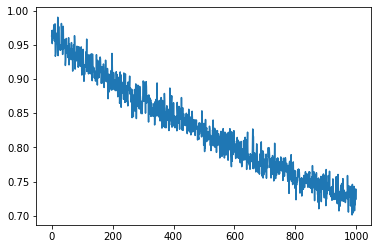

In [45]:
loss_list.extend(hist.history['loss'])
loss_arr =  np.array(loss_list).reshape([-1])
plt.plot(loss_arr)

num_detections 6


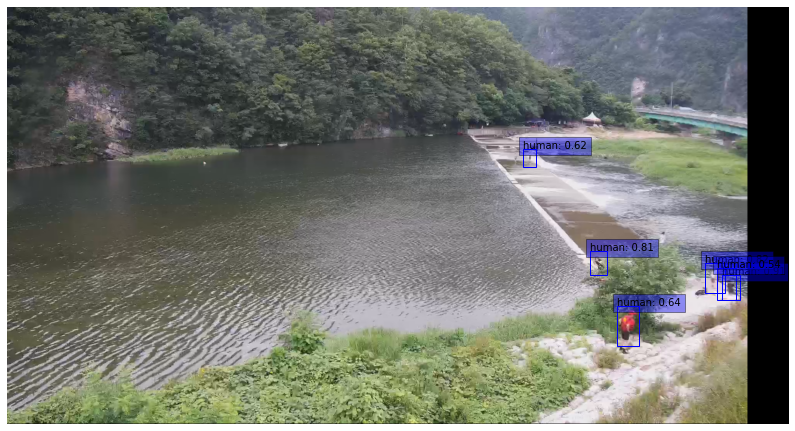

num_detections 5


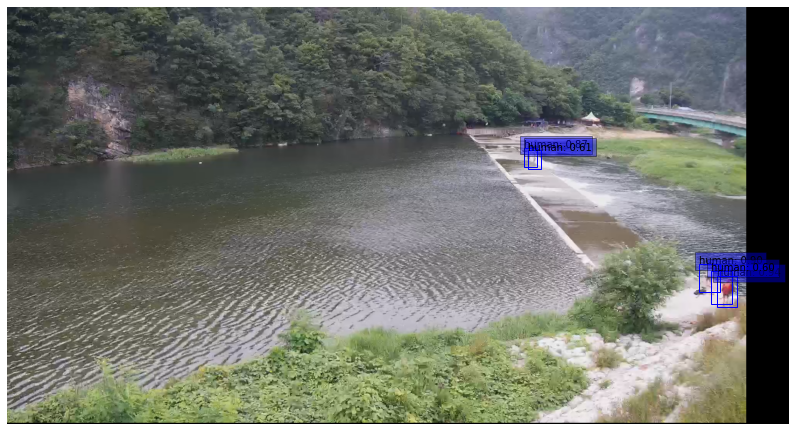

num_detections 4


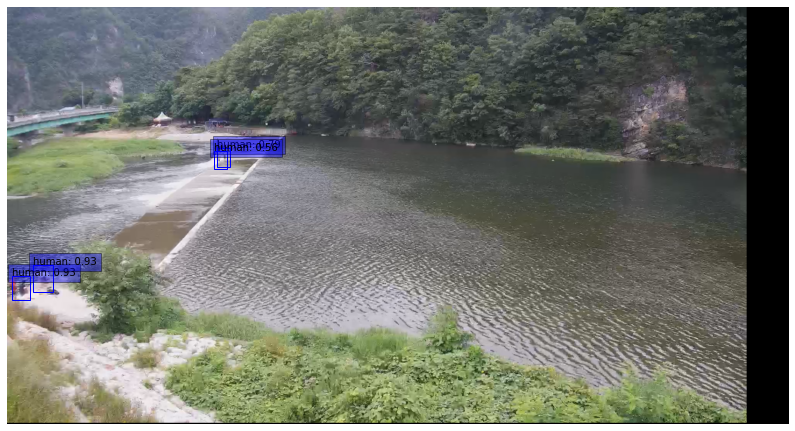

num_detections 5


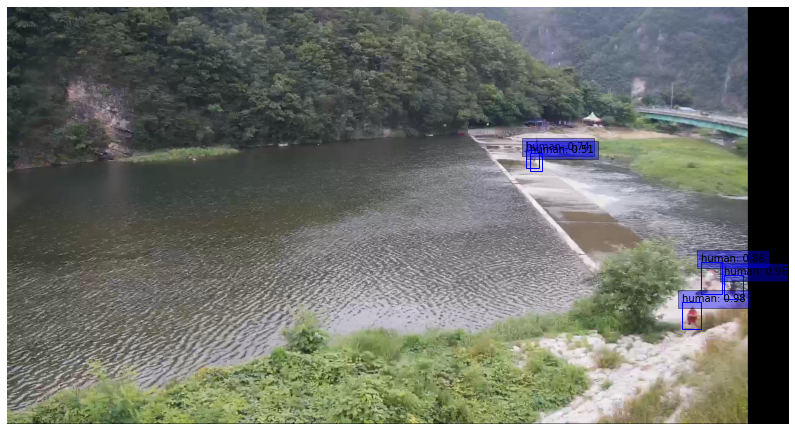

num_detections 8


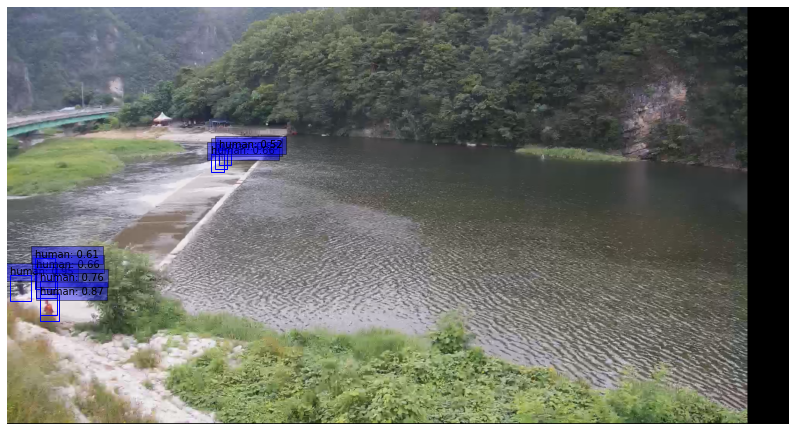

num_detections 4


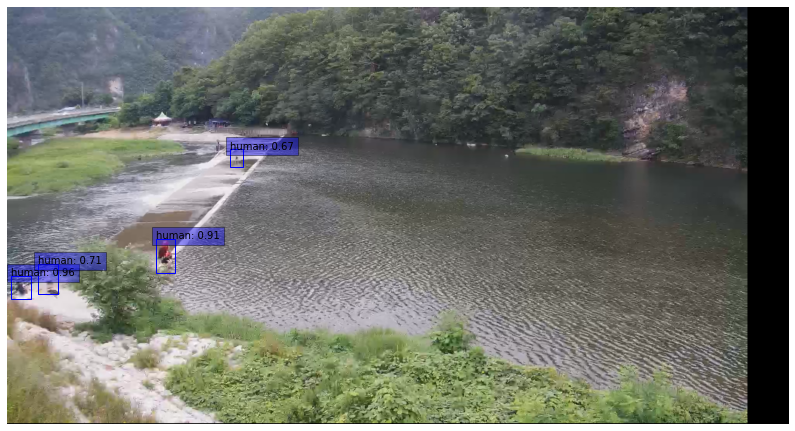

num_detections 8


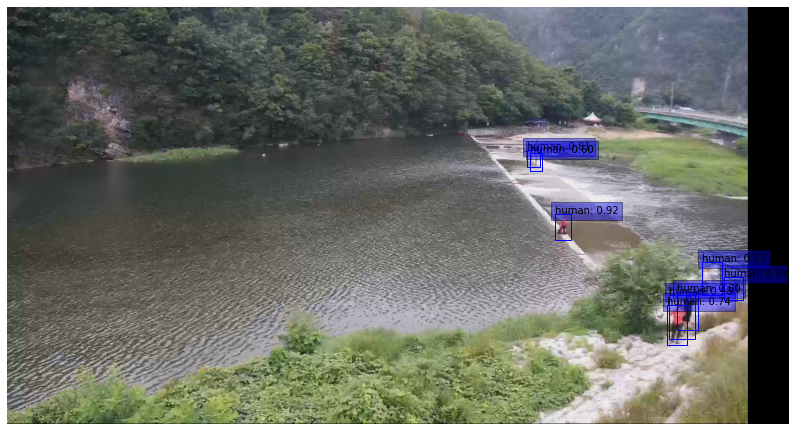

num_detections 4


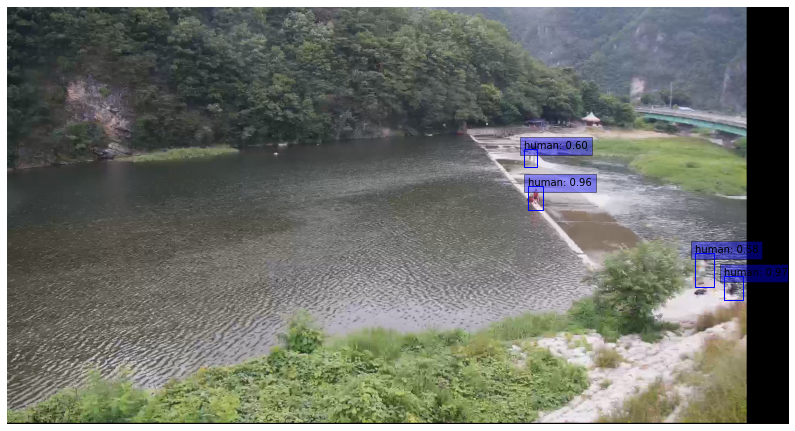

num_detections 4


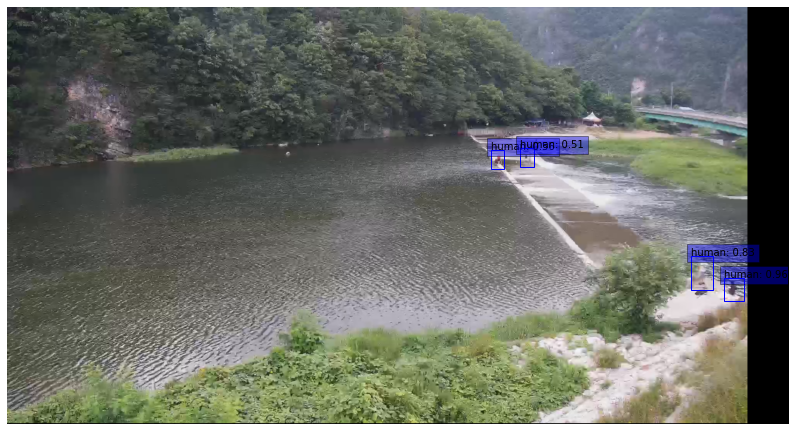

num_detections 3


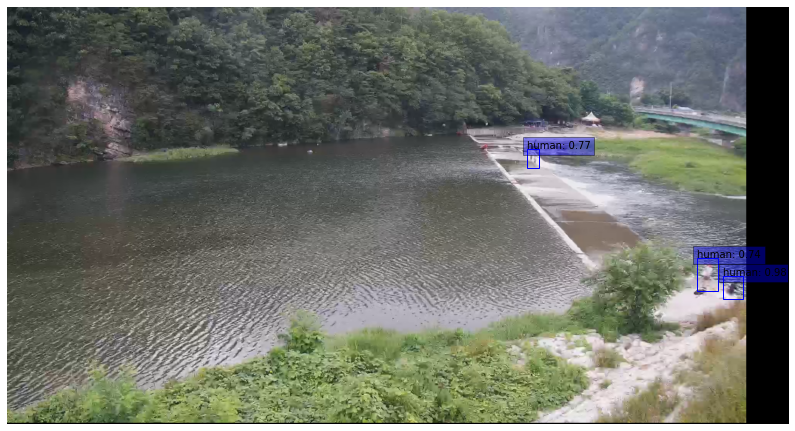

num_detections 3


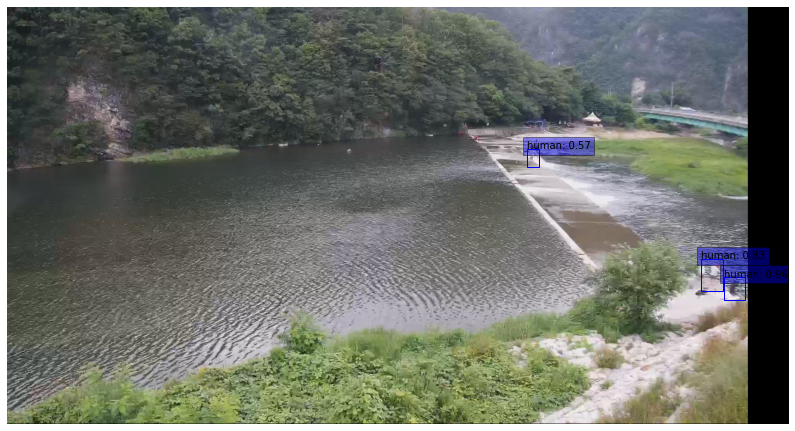

num_detections 2


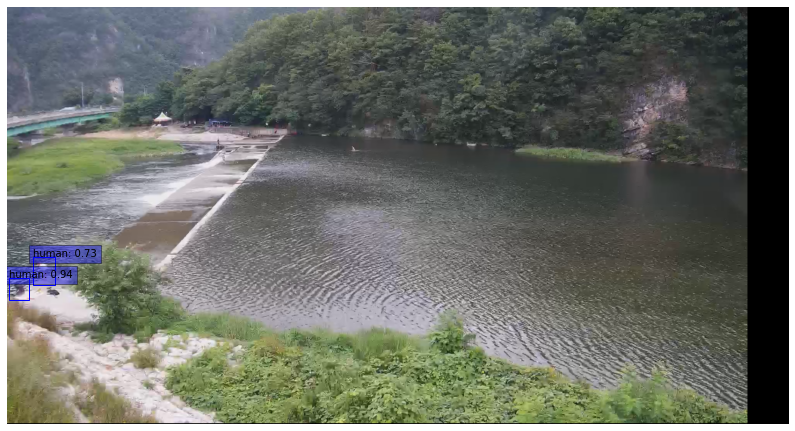

num_detections 5


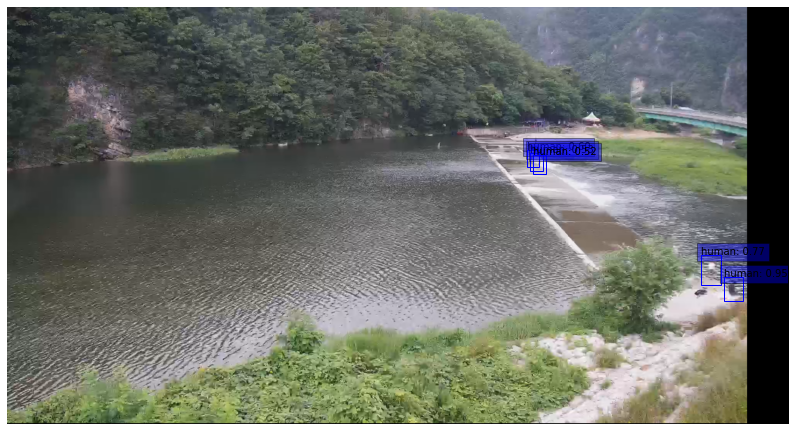

num_detections 4


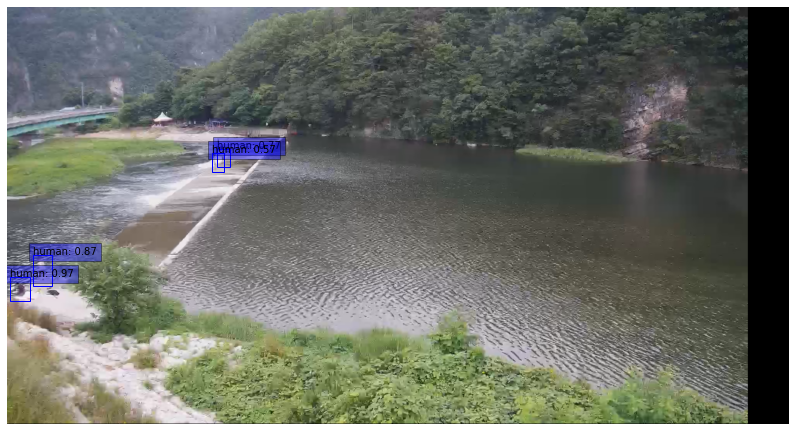

num_detections 4


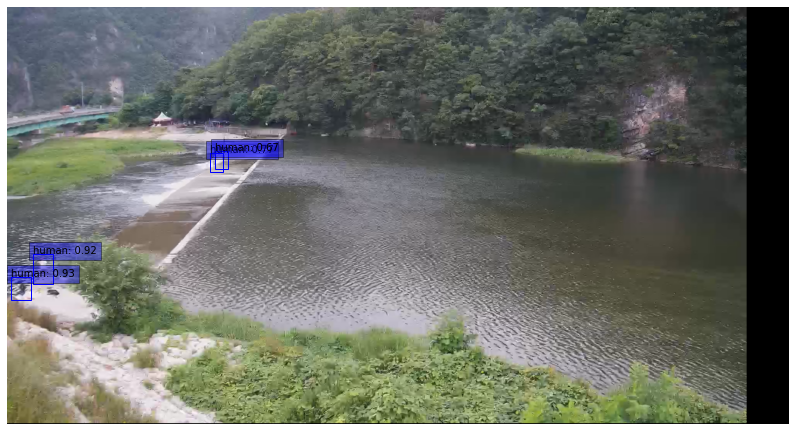

num_detections 5


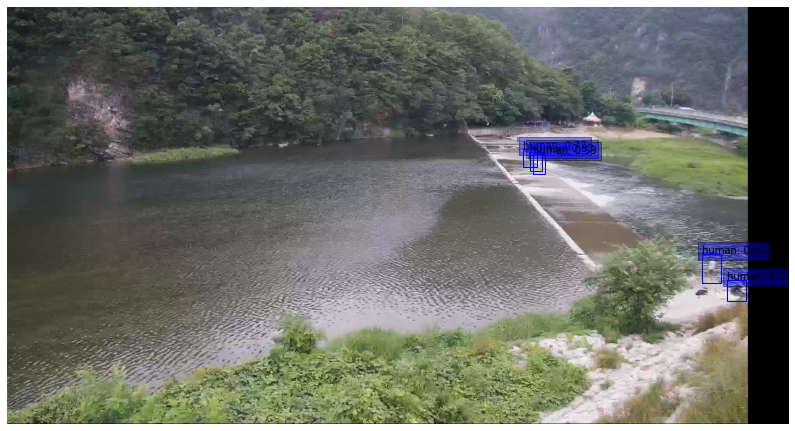

num_detections 5


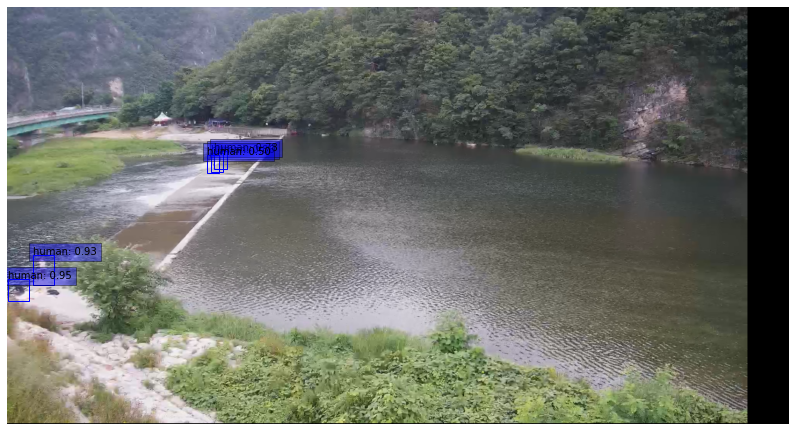

num_detections 5


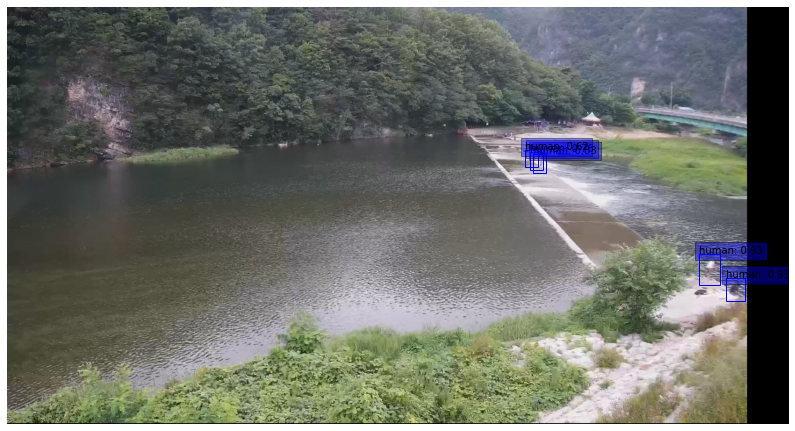

num_detections 5


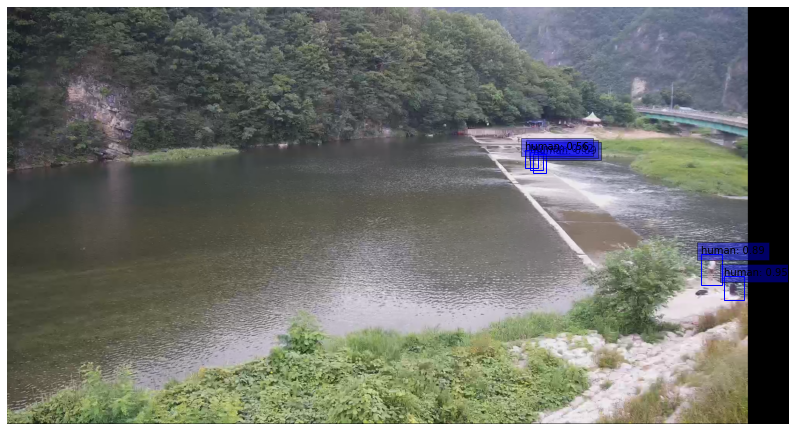

num_detections 3


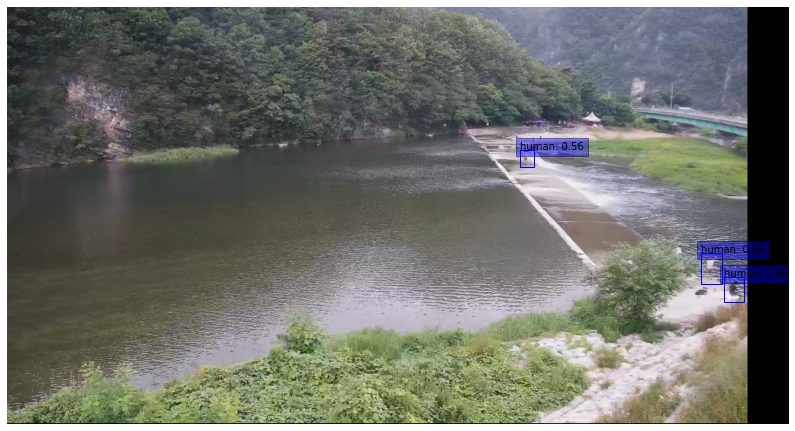

num_detections 2


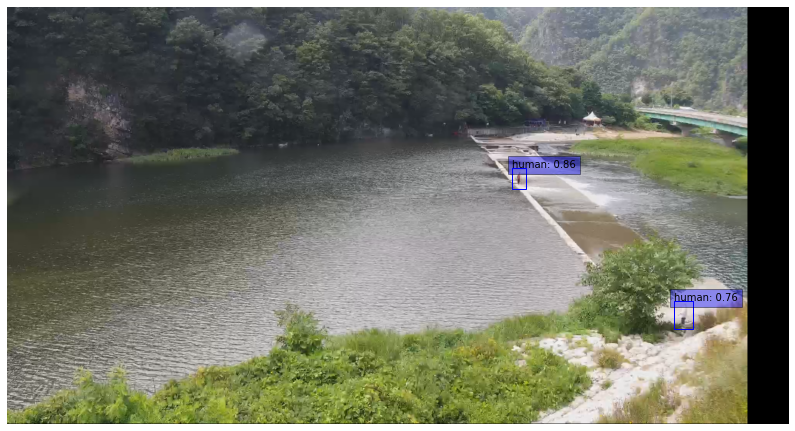

num_detections 3


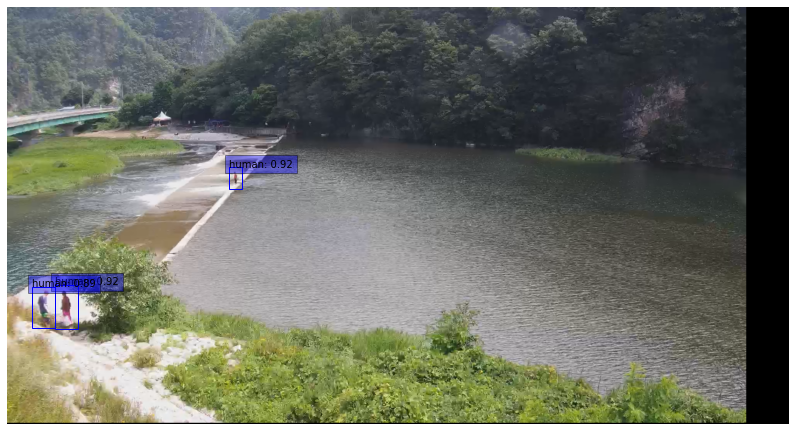

num_detections 1


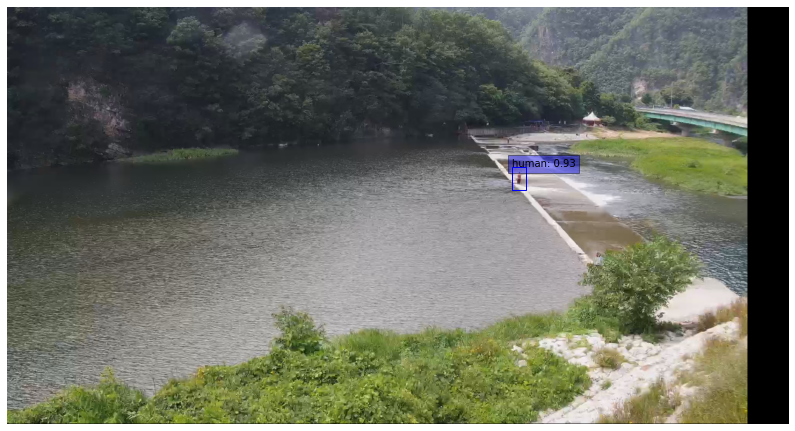

num_detections 1


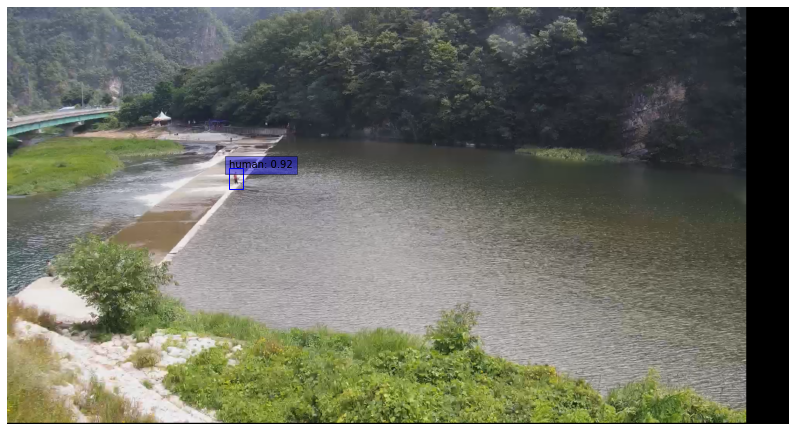

num_detections 4


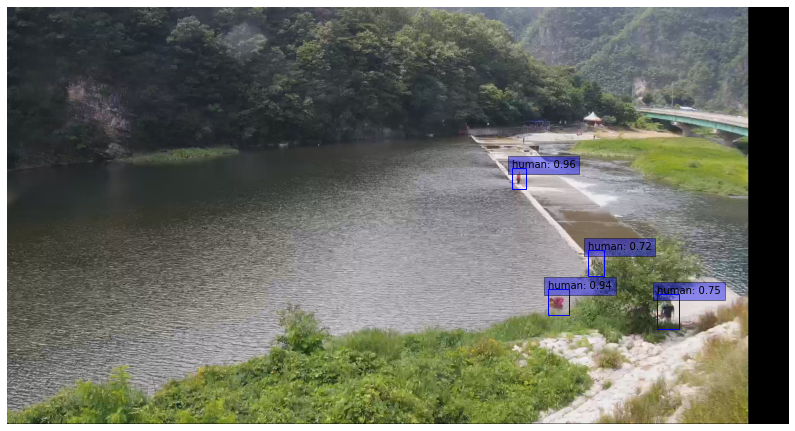

num_detections 2


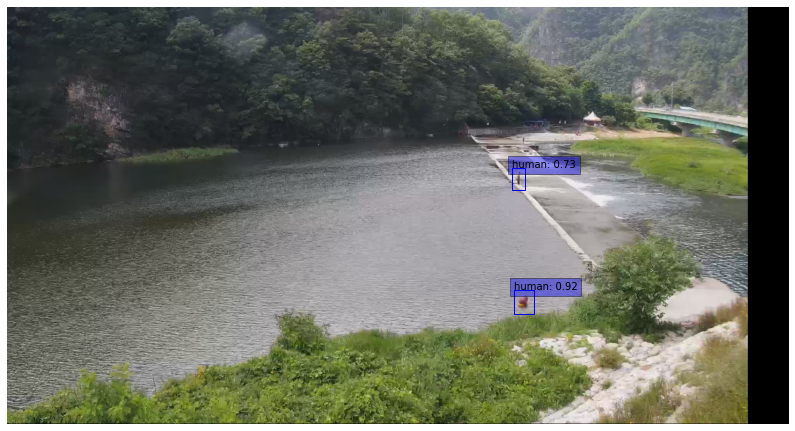

num_detections 4


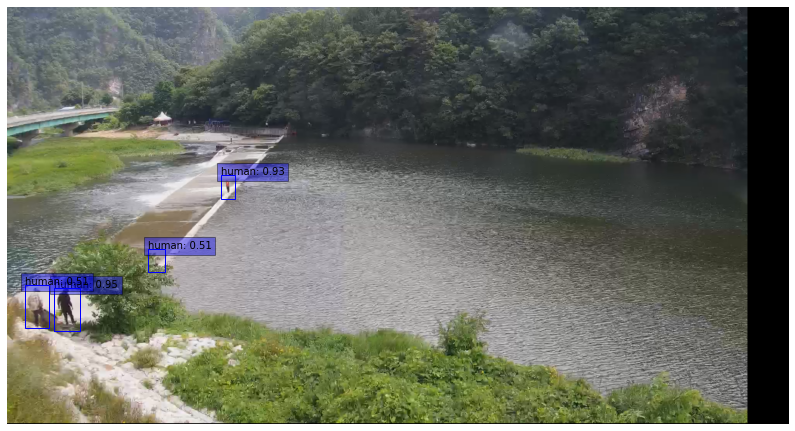

num_detections 4


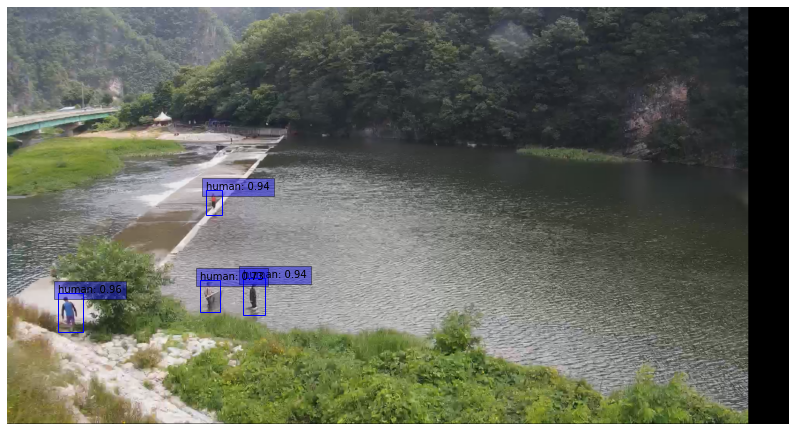

num_detections 4


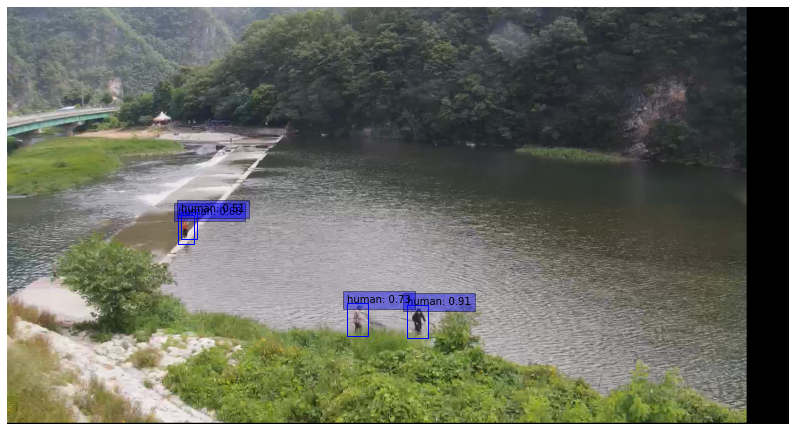

num_detections 5


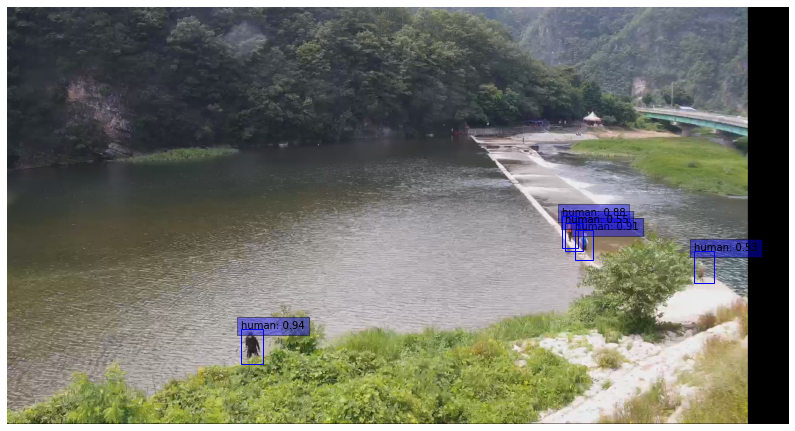

In [54]:
# Change this to `model_dir` when not using the downloaded weights
is_load = False
if is_load:
    weights_dir = model_dir#"data"
    latest_checkpoint = tf.train.latest_checkpoint(weights_dir)
    print('latest_checkpoint', latest_checkpoint)
    model.load_weights(latest_checkpoint)

image = tf.keras.Input(shape=[None, None, 3], name="image")
predictions = model(image, training=False)
detections = DecodePredictions(confidence_threshold=0.5)(image, predictions)
inference_model = tf.keras.Model(inputs=image, outputs=detections)

def prepare_image(image):
    image, _, ratio = resize_and_pad_image(image, jitter=None)
    return tf.expand_dims(image, axis=0), ratio

int2str = WATER_CLASSES

np.set_printoptions(4)

for image, cbbox in val_dataset.take(30):
        
    image = image[0]      
    input_image, ratio = prepare_image(image)
    detections = inference_model.predict(input_image)        
    num_detections = detections.valid_detections[0]
    
    print('num_detections', num_detections)
 
    class_names = [WATER_CLASSES[(int(x))] for x in detections.nmsed_classes[0][:num_detections]    ]
    visualize_detections(
        image,
        detections.nmsed_boxes[0][:num_detections] / ratio,
        class_names,
        detections.nmsed_scores[0][:num_detections],
    )